In [5]:
import gym
import py4j
from py4j.java_gateway import JavaGateway
import random
import time
from gym.spaces import Discrete, Box, Dict, Tuple, MultiBinary, MultiDiscrete
import numpy as np
import math
from scipy import stats
import seaborn as sns
from time import process_time



In [6]:
class HHEnv(gym.Env):
    def __init__(self):
        hyflex = JavaGateway().jvm
        self.action_space = None
        self.problem = hyflex.SAT.SAT(1234)
        
        self.last_h = self.problem.getNumberOfHeuristics()
        self.tail_length = 10
        
        low = np.array(
            [   -1,
                -1
            ],
            dtype=np.float32,
        )
        high = np.array(
            [   self.last_h,
                self.tail_length
            ],
            dtype=np.float32,
        )
        self.observation_space = Box(low, high)
        self.state = None
        self.done = False
        self.solution = None
        self.h_chain = None
        self.luby = None
        self.episode = 0
        self.improvement = None
        self.lubylength = 200000
        self.luby = [0 for i in range(self.lubylength)]
        self.origin_sol = None
        self.time_limit = 600
        self.current_time = None
        self.overall_time = 0
        self.exceed = False
        def _luby(i):
            k = 1
            while True:
                if i == (1 << k) - 1:
                    return 1 << (k - 1)
                elif (1 << (k - 1)) <= i < (1 << k) - 1:
                    return _luby(i - (1 << (k - 1)) + 1)
                k += 1
        for i in range(self.lubylength):
            self.luby[i] = _luby(i+1)
        
    def step(self, action):
        
        # setting time 
        # t1 = time.time()
        t1 = process_time()
        
        # last heuristic applied
        last_heu = self.h_chain[self.iter_num-1]
        
        # update hyper-heuristic chain
        self.h_chain[self.iter_num] = int(action)
        
        self.iter_num += 1  
        
        # number of heuristic left if bigger than max tail length it equal max tail length
        num_heur_left = len(self.h_chain) - self.iter_num
        
        num_heur_left = min(self.tail_length, num_heur_left)
        
        # self.tail_length if num_heur_left > self.tail_length else num_heur_left
        
        
        new_sol = self.problem.applyHeuristic(int(action), 0, 1)
        delta = new_sol - self.origin_sol
        
        # t2 = time.time()
        t2 = process_time()

        
        self.current_time += t2-t1
        self.overall_time += t2-t1

        end = True if (len(self.h_chain)) == self.iter_num else False
    
        
        if end or delta < 0:
            self.done = True 
            reward = (-delta)/(self.current_time)
        else:
            self.done = False
            reward = 0
            
        self.state = (last_heu, num_heur_left)
        
        info = {}
        # Return step information
        self.solution = self.problem.getBestSolutionValue()
        if self.overall_time > self.time_limit:
            self.exceed == True
        
        self.problem.copySolution(1, 0)
        
        return np.array(self.state, dtype=np.float32), reward, self.done, info

    def render(self):
        # Implement viz
        pass
        
    
    def reset(self):
        self.problem.loadInstance(3)
        self.problem.initialiseSolution(0)
        self.origin_sol = self.problem.getFunctionValue(0)
        self.action_space = Discrete(self.problem.getNumberOfHeuristics())
        self.iter_num = 0
        self.current_time = 0
        
        self.improvement = False
        # self.luby = [0 for i in range(self.episode)]
        # def _luby(i):
        #     k = 1
        #     while True:
        #         if i == (1 << k) - 1:
        #             return 1 << (k - 1)
        #         elif (1 << (k - 1)) <= i < (1 << k) - 1:
        #             return _luby(i - (1 << (k - 1)) + 1)
        #         k += 1
        self.h_chain = [-1 for i in range(self.luby[self.episode])]
        self.episode += 1
        self.state = (-1, min(10,len(self.h_chain)))
        self.done = False
        return np.array(self.state, dtype=np.float32)
    
    def evaluation_reset(self):
        self.iter_num = 0
        self.current_time = 0
        
        self.improvement = False
        self.h_chain = [-1 for i in range(self.luby[self.episode])]
        self.episode += 1
        self.state = (-1, min(10,len(self.h_chain)))
        self.done = False
        return np.array(self.state, dtype=np.float32)
    
    

In [7]:
class HHagent():
    def __init__(self, 
                 time = 10, min_lr=0.1, 
                 min_epsilon=0.1, discount=1.0, decay=25):
        
        self.env = HHEnv()
        self.env.reset()        
        self.buckets = (self.env.action_space.n + 1, self.env.tail_length + 1)
        
        self.time = time
        self.min_lr = min_lr
        self.min_epsilon = min_epsilon
        self.discount = discount
        self.decay = decay
        self.evl_time = 2

        
        # This is the action-value function being initialized to 0's
        self.Q_table = np.zeros(self.buckets + (self.env.action_space.n,))
        
        #
        self.funV = []
        self.functionValue = []
        
        

    def discretize_state(self, obs):
        """
        Takes an observation of the environment and aliases it.
        By doing this, very similar observations can be treated
        as the same and it reduces the state space so that the 
        Q-table can be smaller and more easily filled.
        
        Input:
        obs (tuple): Tuple containing 4 floats describing the current
                     state of the environment.
        
        Output:
        discretized (tuple): Tuple containing 4 non-negative integers smaller 
                             than n where n is the number in the same position
                             in the buckets list.
        """
        discretized = list()
        for i in range(len(obs)):
            discretized.append(int(obs[i]))

        return tuple(discretized)

    def choose_action(self, state):
        """
        Implementation of e-greedy algorithm. Returns an action (0 or 1).
        
        Input:
        state (tuple): Tuple containing 4 non-negative integers within
                       the range of the buckets.
        
        Output:
        (int) Returns either 0 or 1
        """
        if (np.random.random() < self.epsilon):
            return self.env.action_space.sample() 
        else:
            return np.argmax(self.Q_table[state])
        
    def get_action(self, state, e):
        """
        Another policy based on the Q-table. Slight variation from 
        e-greedy. It assumes the state fed hasn't been discretized and 
        returns a vector with probabilities for each action.
        
        Input: 
        state (tuple): Contains the 4 floats used to describe
                       the current state of the environment.
        e (int): Denotes the episode at which the agent is supposed
                 to be, helping balance exploration and exploitation.
                 
        Output:
        action_vector (numpy array): Vector containing the probability
                                     of each action being chosen at the
                                     current state.
        """
        action_vector = self.Q_table[state]
        epsilon = self.get_epsilon(e)
        action_vector = self.normalize(action_vector, epsilon)
        return action_vector

    def normalize(self, action_vector, epsilon):
        """
        Returns a vector with components adding to 1. Ensures 
        
        Input:
        action_vector (numpy array): Contains expected values for each
                                     action at current state from Q-table.
        epsilon (float): Chances that the e-greedy algorithm would 
                         choose an action at random. With this pol
        
        Output:
        new_vector (numpy array): Vector containing the probability
                                  of each action being chosen at the
                                  current state.
        """
        
        total = sum(action_vector)
        new_vector = (1-epsilon)*action_vector/(total)
        new_vector += epsilon/2.0
        return new_vector

    def update_q(self, state, action, reward, new_state):
        """
        Updates Q-table using the rule as described by Sutton and Barto in
        Reinforcement Learning.
        """
        
        self.Q_table[state][action] += (self.learning_rate * 
                                        (reward 
                                         + self.discount * np.max(self.Q_table[new_state]) 
                                         - self.Q_table[state][action]))

    def get_epsilon(self, t):
        """Gets value for epsilon. It declines as we advance in episodes."""
        # Ensures that there's almost at least a min_epsilon chance of randomly exploring
        return max(self.min_epsilon, min(1., 1. - math.log10((t + 1) / self.decay)))

    def get_learning_rate(self, t):
        """Gets value for learning rate. It declines as we advance in episodes."""
        # Learning rate also declines as we add more episodes
        return max(self.min_lr, min(1., 1. - math.log10((t + 1) / self.decay)))

    def train(self):
        """
        Trains agent making it go through the environment and choose actions
        through an e-greedy policy and updating values for its Q-table. The 
        agent is trained by default for 500 episodes with a declining 
        learning rate and epsilon values that with the default values,
        reach the minimum after 198 episodes.
        """
        # Looping for each episode
#         for e in range(self.num_episodes):
        e= 0
        while self.time > self.env.overall_time:
            print(self.env.overall_time)
            e += 1
            
            # Initializes the state
            current_state = self.discretize_state(self.env.reset())
            print("Best Solution: {}".format(self.env.problem.getBestSolutionValue()))

            self.learning_rate = self.get_learning_rate(e)
            self.epsilon = self.get_epsilon(e)
            done = False
            
            # Looping for each step
            while not done:
                # Choose A from S
                action = self.choose_action(current_state)
                # Take action
                obs, reward, done, _ = self.env.step(action)
                new_state = self.discretize_state(obs)
                # Update Q(S,A)
                self.update_q(current_state, action, reward, new_state)
                current_state = new_state
                
                # We break out of the loop when done is False which is
                # a terminal state.
            print("Current Funciton Value: {}".format(self.env.problem.getFunctionValue(0)))
            self.funV.append(self.env.problem.getFunctionValue(0))
        print('Finished training! Episode is {}'.format(e))
    
    def plot_learning(self):
        """
        Plots the number of steps at each episode and prints the
        amount of times that an episode was successfully completed.
        """
#         fig, axes = plt.subplots(1,2, figsize=(15, 5))
        sns.lineplot(x = range(len(self.funV)), y = self.funV)
#         sns.scatterplot(ax=axes[1], x= range(len(self.functionValue)), y = self.functionValue)

    def save(self):
        np.save('Qtable',self.Q_table)
    
    def plot_evaluation(self):
        sns.lineplot(x = range(len(self.functionValue)), y = self.functionValue)
        """
        Plots the number of steps at each episode and prints the
        amount of times that an episode was successfully completed.
        """
#         fig, axes = plt.subplots(1,2, figsize=(15, 5))
#         sns.scatterplot(ax=axes[1], x= range(len(self.functionValue)), y = self.functionValue) 
        
    
    def evaluate(self):
        """
        Evaluate the env
        """
        env = HHEnv()
        env.reset()
        e = 0
        
        while not self.evl_time < env.overall_time:
            # if e % 5000 == 0:
            #     current_state = self.discretize_state(env.reset())
            # else:
            #     current_state = self.discretize_state(env.evaluation_reset())
            current_state = self.discretize_state(env.evaluation_reset())
            self.learning_rate = self.get_learning_rate(e)
            self.epsilon = self.get_epsilon(e)
            e += 1
            done = False
            
            while not done:
                action = self.choose_action(current_state)
                obs, reward, done, _ = env.step(action)
            
            print('function value is: {}'.format(env.problem.getFunctionValue(0)))
            self.functionValue.append(env.problem.getFunctionValue(0))
        print("Best Solution is {}".format(env.problem.getBestSolutionValue())) 
    


In [8]:
def load_q_learning():
    agent = HHagent()
    print('Fininsh initailize')
    agent.train()
    agent.plot_learning()
    agent.save()

    return agent

Fininsh initailize
0
Best Solution: 306.0
Current Funciton Value: 321.0
0.00014100000000016877
Best Solution: 306.0
Current Funciton Value: 357.0
0.00025400000000042056
Best Solution: 306.0
Current Funciton Value: 337.0
0.0003600000000005821
Best Solution: 306.0
Current Funciton Value: 319.0
0.00045300000000070284
Best Solution: 306.0
Current Funciton Value: 339.0
0.0005160000000006271
Best Solution: 306.0
Current Funciton Value: 297.0
0.0006590000000006313
Best Solution: 297.0
Current Funciton Value: 332.0
0.000844000000000733
Best Solution: 297.0
Current Funciton Value: 343.0
0.000948000000000615
Best Solution: 297.0
Current Funciton Value: 337.0
0.001112000000000446
Best Solution: 297.0
Current Funciton Value: 318.0
0.0012140000000004925
Best Solution: 297.0
Current Funciton Value: 310.0
0.0012590000000005652
Best Solution: 297.0
Current Funciton Value: 316.0
0.0013690000000003977
Best Solution: 297.0
Current Funciton Value: 323.0
0.0014460000000000583
Best Solution: 297.0
Current F

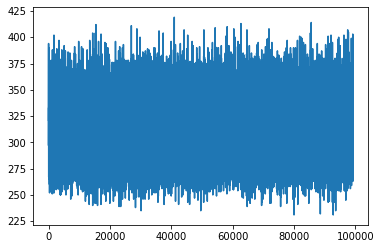

In [9]:
agent = load_q_learning()

In [10]:
agent.evaluate()

function value is: 306.0
function value is: 306.0
function value is: 306.0
function value is: 306.0
function value is: 295.0
function value is: 295.0
function value is: 295.0
function value is: 288.0
function value is: 290.0
function value is: 283.0
function value is: 283.0
function value is: 280.0
function value is: 273.0
function value is: 269.0
function value is: 260.0
function value is: 257.0
function value is: 288.0
function value is: 280.0
function value is: 278.0
function value is: 263.0
function value is: 263.0
function value is: 263.0
function value is: 258.0
function value is: 297.0
function value is: 291.0
function value is: 287.0
function value is: 295.0
function value is: 289.0
function value is: 290.0
function value is: 289.0
function value is: 274.0
function value is: 274.0
function value is: 265.0
function value is: 260.0
function value is: 249.0
function value is: 249.0
function value is: 235.0
function value is: 235.0
function value is: 235.0
function value is: 232.0


In [11]:
agent.evaluate()

function value is: 303.0
function value is: 296.0
function value is: 289.0
function value is: 288.0
function value is: 287.0
function value is: 287.0
function value is: 287.0
function value is: 287.0
function value is: 283.0
function value is: 281.0
function value is: 279.0
function value is: 291.0
function value is: 291.0
function value is: 277.0
function value is: 273.0
function value is: 273.0
function value is: 273.0
function value is: 273.0
function value is: 266.0
function value is: 289.0
function value is: 289.0
function value is: 281.0
function value is: 281.0
function value is: 278.0
function value is: 260.0
function value is: 259.0
function value is: 259.0
function value is: 261.0
function value is: 251.0
function value is: 251.0
function value is: 249.0
function value is: 245.0
function value is: 229.0
function value is: 230.0
function value is: 224.0
function value is: 221.0
function value is: 221.0
function value is: 218.0
function value is: 218.0
function value is: 231.0


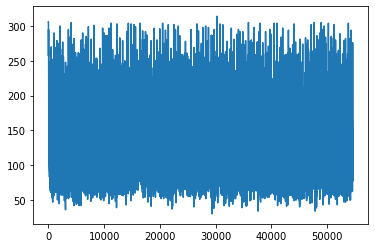

In [12]:
agent.plot_evaluation()